<a href="https://colab.research.google.com/github/Manas24vani/ML_project_3/blob/main/Final_ML_Project3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Machine Learning Project 3

In [85]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 

In [86]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, recall_score, classification_report, confusion_matrix, f1_score, precision_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

In [87]:
from sklearn.pipeline import Pipeline

In [88]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

In [89]:
import warnings 
warnings.filterwarnings('ignore')

In [90]:
plt.style.use('fivethirtyeight')


In [91]:
df = pd.read_csv('heart_failure_clinical_records_dataset.csv')

In [92]:
df.keys()

Index(['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes',
       'ejection_fraction', 'high_blood_pressure', 'platelets',
       'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'time',
       'DEATH_EVENT'],
      dtype='object')

# Inital EDA

In [ ]:
df.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       299 non-null    float64
 1   anaemia                   299 non-null    int64  
 2   creatinine_phosphokinase  299 non-null    int64  
 3   diabetes                  299 non-null    int64  
 4   ejection_fraction         299 non-null    int64  
 5   high_blood_pressure       299 non-null    int64  
 6   platelets                 299 non-null    float64
 7   serum_creatinine          299 non-null    float64
 8   serum_sodium              299 non-null    int64  
 9   sex                       299 non-null    int64  
 10  smoking                   299 non-null    int64  
 11  time                      299 non-null    int64  
 12  DEATH_EVENT               299 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 30.5 KB


In [ ]:
df.isna().sum()

age                         0
anaemia                     0
creatinine_phosphokinase    0
diabetes                    0
ejection_fraction           0
high_blood_pressure         0
platelets                   0
serum_creatinine            0
serum_sodium                0
sex                         0
smoking                     0
time                        0
DEATH_EVENT                 0
dtype: int64

## Distribution of each feature using histograms

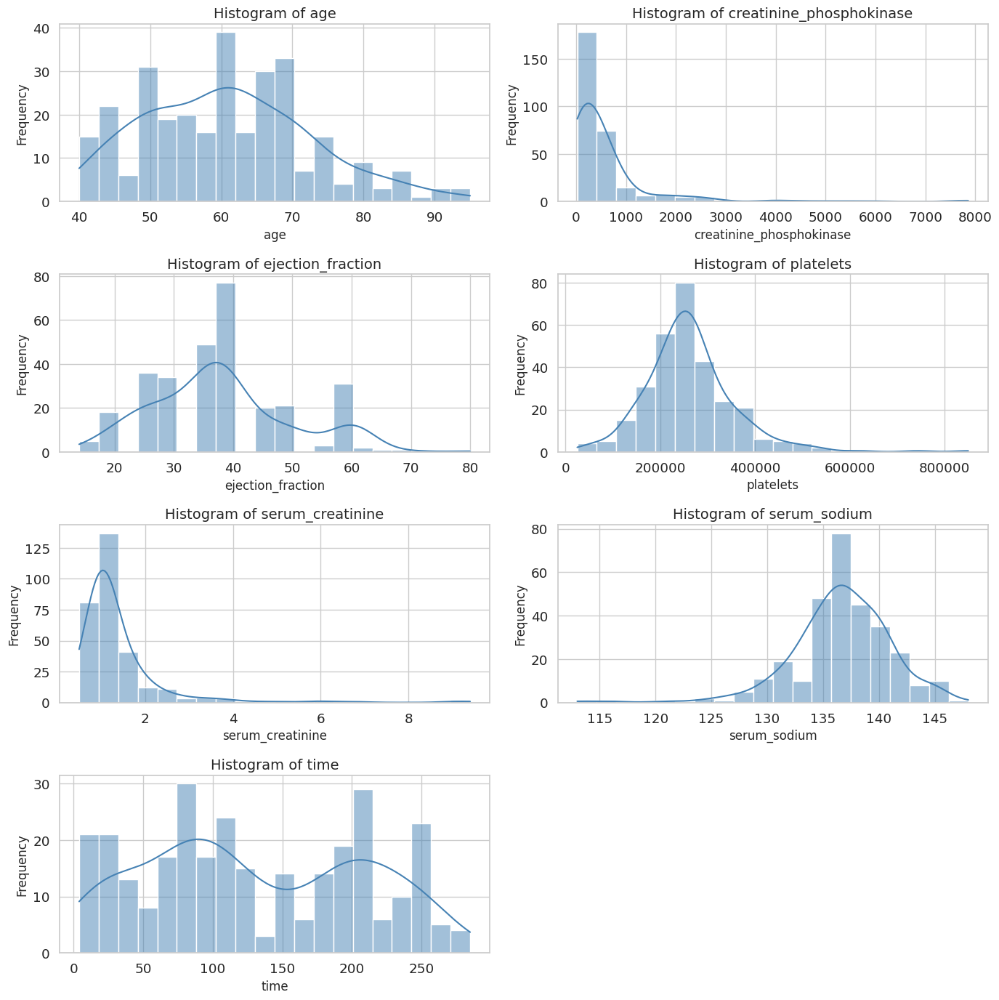

In [ ]:
# Set Seaborn plotting style
sns.set(style="whitegrid", font_scale=1.2)

# Create a histogram for each feature
continuous_features = ["age", "creatinine_phosphokinase", "ejection_fraction", "platelets", "serum_creatinine", "serum_sodium", "time"]
n_features = len(continuous_features)
n_cols = 2
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 14))

for idx, feature in enumerate(continuous_features):
    row, col = idx // n_cols, idx % n_cols
    ax = axes[row, col]

    sns.histplot(data=df, x=feature, kde=True, color='steelblue', ax=ax, bins=20)

    # Set the title and axis labels
    ax.set_title(f'Histogram of {feature}', fontsize=14)
    ax.set_xlabel(feature, fontsize=12)
    ax.set_ylabel('Frequency', fontsize=12)

# Remove any extra subplots (if any)
for idx in range(n_features, n_rows * n_cols):
    row, col = idx // n_cols, idx % n_cols
    fig.delaxes(axes[row, col])

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

## Visualize the distribution of the target variable (death event)

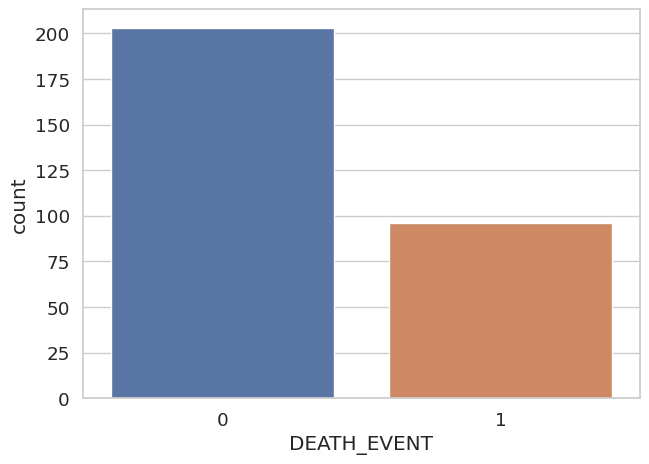

In [ ]:
sns.countplot(x="DEATH_EVENT", data=df)
plt.show()

## Visualize the distribution of age groups vs death event

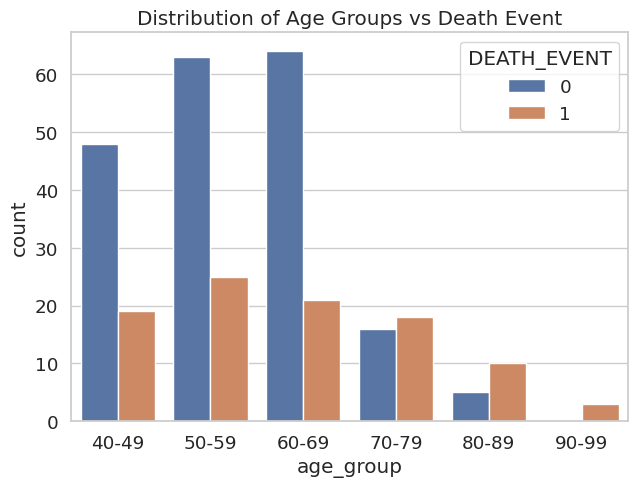

In [ ]:
bins = [40, 50, 60, 70, 80, 90, 100]
labels = ["40-49", "50-59", "60-69", "70-79", "80-89", "90-99"]
df["age_group"] = pd.cut(df["age"], bins=bins, labels=labels)

plt.figure()
sns.countplot(x="age_group", hue="DEATH_EVENT", data=df)
plt.title("Distribution of Age Groups vs Death Event")
plt.show()

## Box plot of ejection fraction vs death event

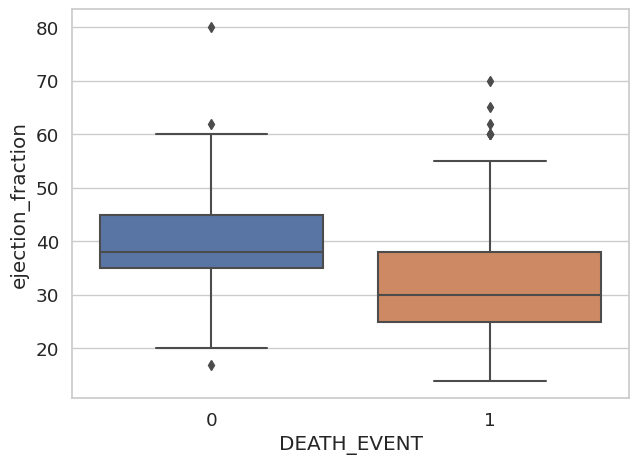

In [ ]:
sns.boxplot(x="DEATH_EVENT", y="ejection_fraction", data=df)
plt.show()

## Correlation matrix using a heatmap

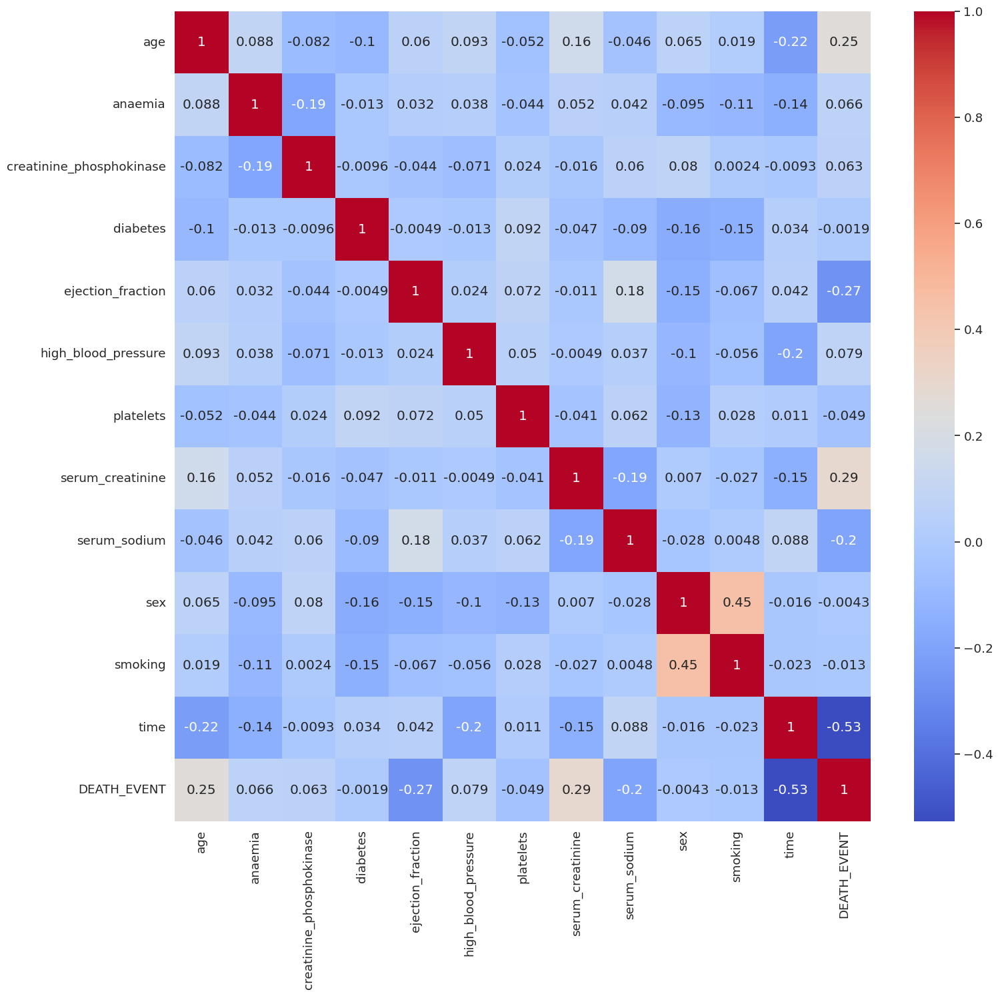

In [ ]:
corr_matrix = df.corr()
plt.figure(figsize=(15, 15))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm")
plt.show()

## Correlation of each feature with the target variable

In [ ]:
print(corr_matrix["DEATH_EVENT"].sort_values(ascending=False))

DEATH_EVENT                 1.000000
serum_creatinine            0.294278
age                         0.253729
high_blood_pressure         0.079351
anaemia                     0.066270
creatinine_phosphokinase    0.062728
diabetes                   -0.001943
sex                        -0.004316
smoking                    -0.012623
platelets                  -0.049139
serum_sodium               -0.195204
ejection_fraction          -0.268603
time                       -0.526964
Name: DEATH_EVENT, dtype: float64


## Distribution of categorical features

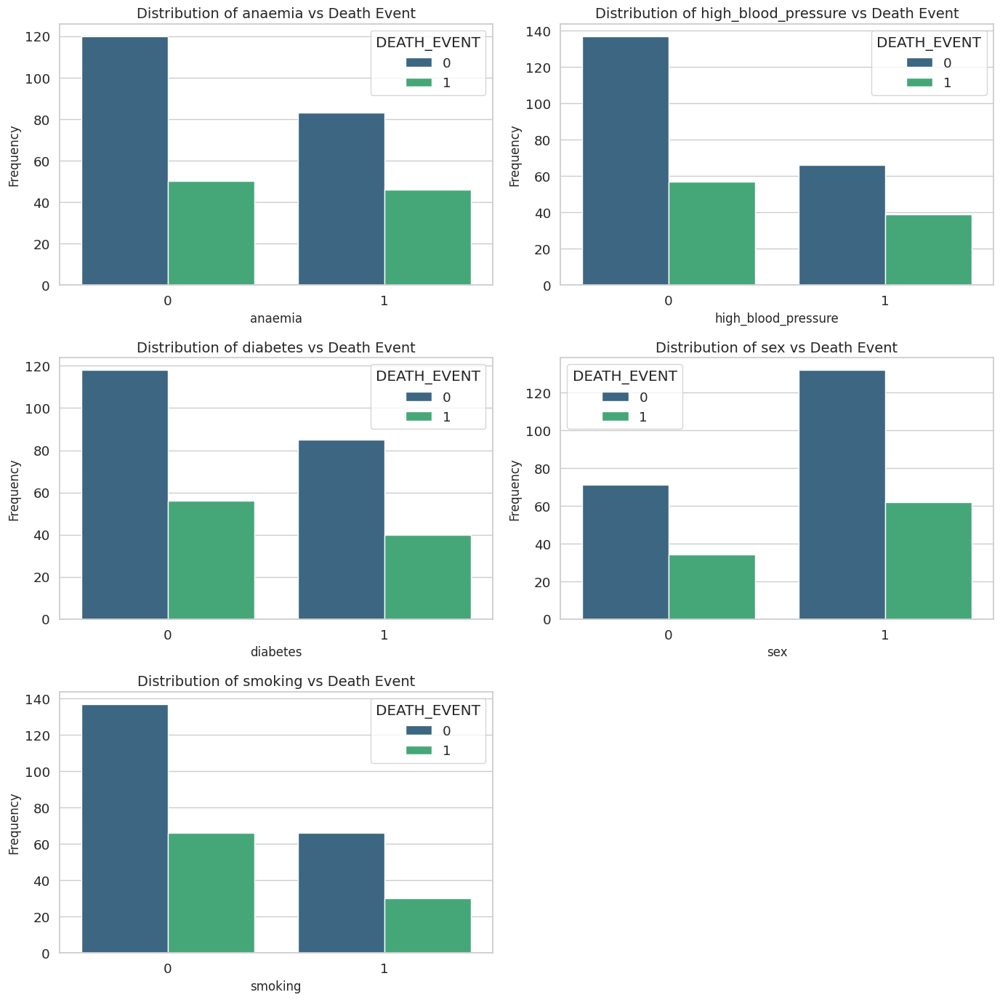

In [ ]:
# Set Seaborn plotting style
sns.set(style="whitegrid", font_scale=1.2)

categorical_features = ["anaemia", "high_blood_pressure", "diabetes", "sex", "smoking"]
n_features = len(categorical_features)
n_cols = 2
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 14))

for idx, feature in enumerate(categorical_features):
    row, col = idx // n_cols, idx % n_cols
    ax = axes[row, col]

    sns.countplot(x=feature, hue="DEATH_EVENT", data=df, ax=ax, palette="viridis")

    # Set the title and axis labels
    ax.set_title(f'Distribution of {feature} vs Death Event', fontsize=14)
    ax.set_xlabel(feature, fontsize=12)
    ax.set_ylabel('Frequency', fontsize=12)

# Remove any extra subplots (if any)
for idx in range(n_features, n_rows * n_cols):
    row, col = idx // n_cols, idx % n_cols
    fig.delaxes(axes[row, col])

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()


## Relationship between continuous features and the target variable using kernel density plots

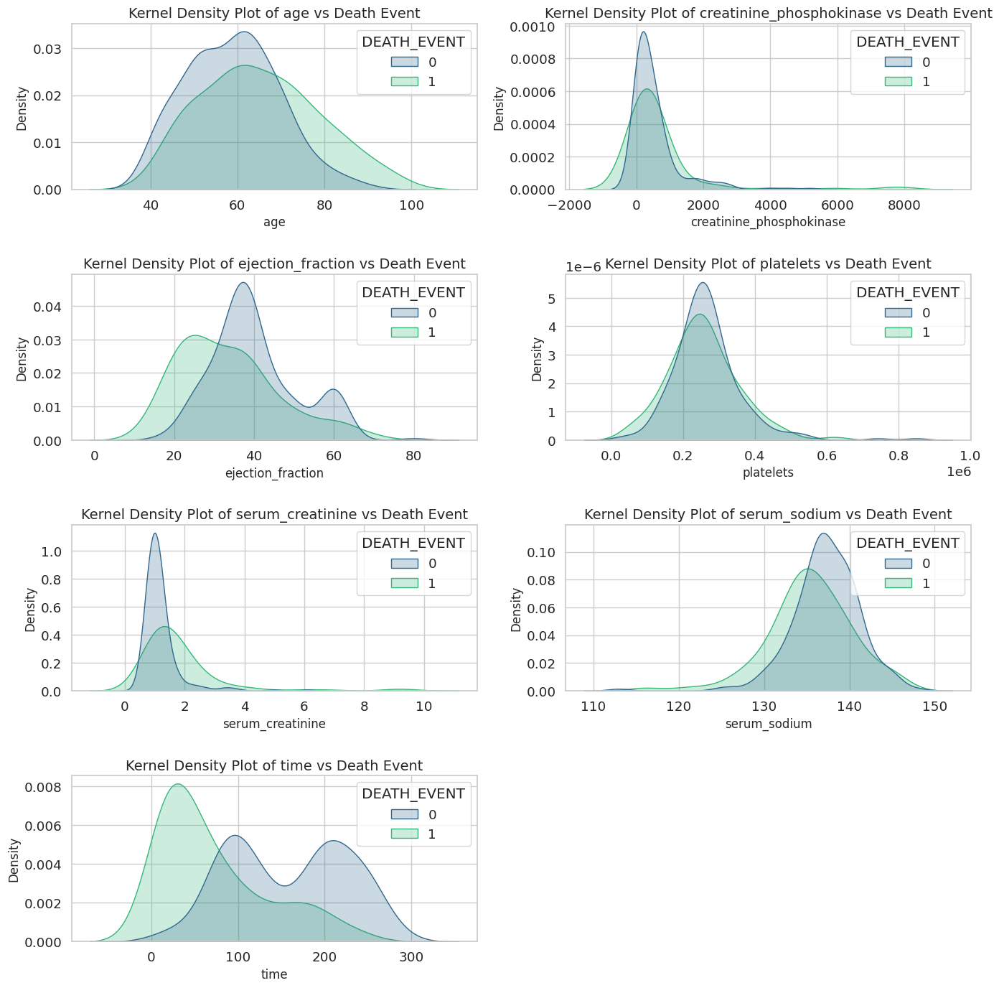

In [ ]:
# Set Seaborn plotting style
sns.set(style="whitegrid", font_scale=1.2)

continuous_features = ["age", "creatinine_phosphokinase", "ejection_fraction", "platelets", "serum_creatinine", "serum_sodium", "time"]
n_features = len(continuous_features)
n_cols = 2
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 14))

for idx, feature in enumerate(continuous_features):
    row, col = idx // n_cols, idx % n_cols
    ax = axes[row, col]

    sns.kdeplot(data=df, x=feature, hue="DEATH_EVENT", common_norm=False, fill=True, ax=ax, palette="viridis")

    # Set the title and axis labels
    ax.set_title(f'Kernel Density Plot of {feature} vs Death Event', fontsize=14)
    ax.set_xlabel(feature, fontsize=12)
    ax.set_ylabel('Density', fontsize=12)

# Remove any extra subplots (if any)
for idx in range(n_features, n_rows * n_cols):
    row, col = idx // n_cols, idx % n_cols
    fig.delaxes(axes[row, col])

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()



## Cumulative Distribution Function (CDF) plots for continuous features

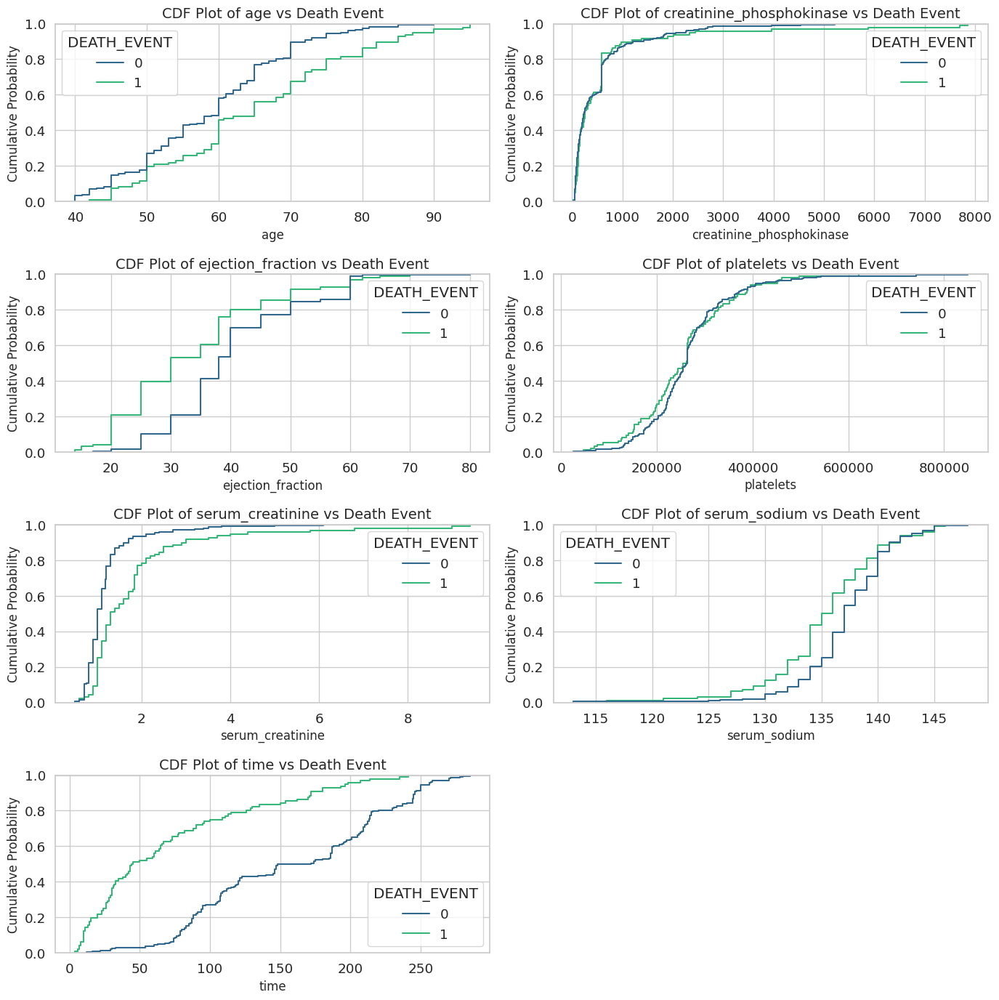

In [ ]:
# Set Seaborn plotting style
sns.set(style="whitegrid", font_scale=1.2)

continuous_features = ["age", "creatinine_phosphokinase", "ejection_fraction", "platelets", "serum_creatinine", "serum_sodium", "time"]
n_features = len(continuous_features)
n_cols = 2
n_rows = (n_features + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 14))

for idx, feature in enumerate(continuous_features):
    row, col = idx // n_cols, idx % n_cols
    ax = axes[row, col]

    sns.ecdfplot(data=df, x=feature, hue="DEATH_EVENT", ax=ax, palette="viridis")

    # Set the title and axis labels
    ax.set_title(f'CDF Plot of {feature} vs Death Event', fontsize=14)
    ax.set_xlabel(feature, fontsize=12)
    ax.set_ylabel('Cumulative Probability', fontsize=12)

# Remove any extra subplots (if any)
for idx in range(n_features, n_rows * n_cols):
    row, col = idx // n_cols, idx % n_cols
    fig.delaxes(axes[row, col])

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

## Pairwise scatter plots
### For selected features that show high correlation with the target variable, we can create pairwise scatter plots to visualize their relationship with each other

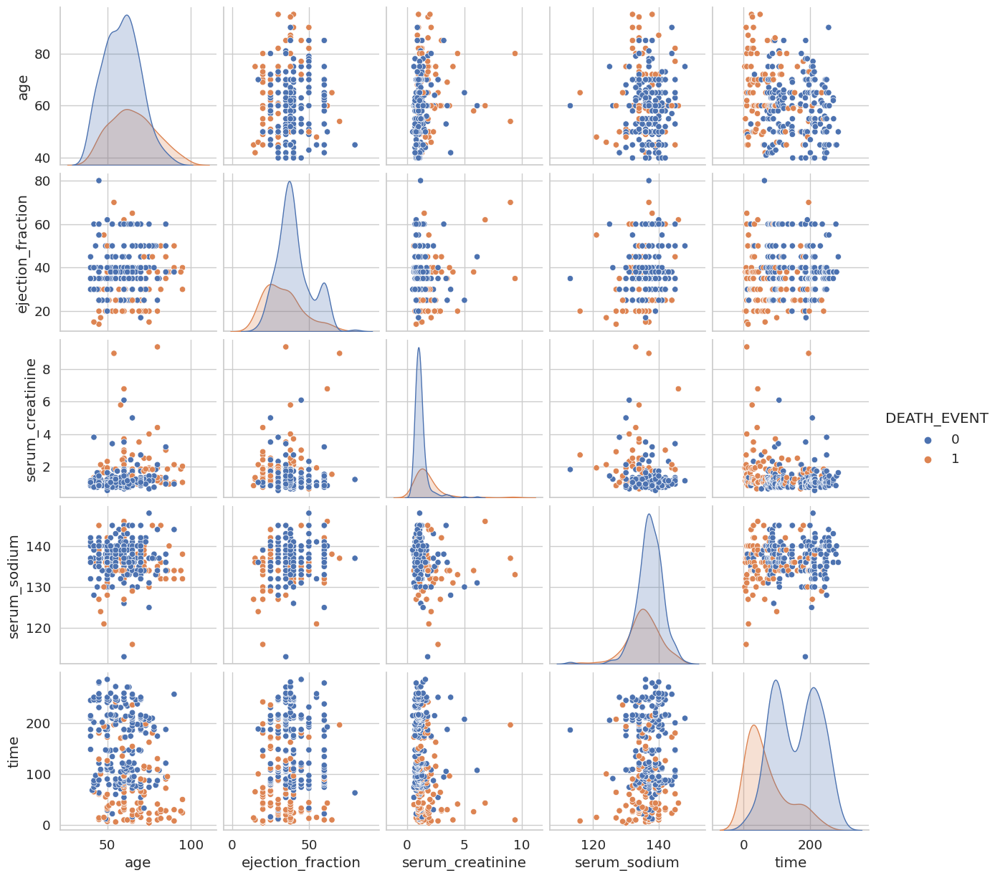

In [ ]:
# Select important features based on correlation with target variable
selected_features = ["age", "ejection_fraction", "serum_creatinine", "serum_sodium", "time"]

# Create pairwise scatter plots
sns.pairplot(data=df, vars=selected_features, hue="DEATH_EVENT")
plt.show()


## Line plot of time vs serum creatinine
### Relationship between time and other continuous features using line plots

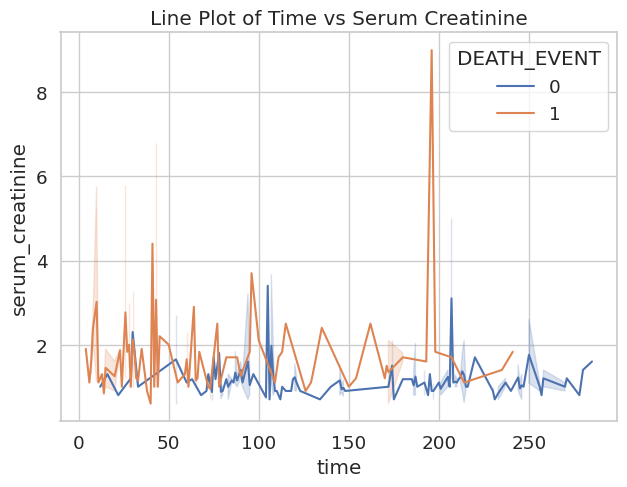

In [ ]:
plt.figure()
sns.lineplot(x="time", y="serum_creatinine", hue="DEATH_EVENT", data=df)
plt.title("Line Plot of Time vs Serum Creatinine")
plt.show()

In [ ]:
df.columns

Index(['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes',
       'ejection_fraction', 'high_blood_pressure', 'platelets',
       'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'time',
       'DEATH_EVENT', 'age_group'],
      dtype='object')

In [ ]:
numerical_cols = ['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes',
       'ejection_fraction', 'high_blood_pressure', 'platelets',
       'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'time'] 

# Baseline Models

In [93]:
df.keys()

Index(['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes',
       'ejection_fraction', 'high_blood_pressure', 'platelets',
       'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'time',
       'DEATH_EVENT'],
      dtype='object')

In [94]:
features = ['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes',
       'ejection_fraction', 'high_blood_pressure', 'platelets',
       'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'time'] 
      
target = ['DEATH_EVENT']

In [95]:
from sklearn.preprocessing import StandardScaler

In [96]:

X = df[features].copy()
y = df['DEATH_EVENT'].copy()




In [271]:
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size=0.20)

### Logistic Regression 

In [272]:
log_reg = LogisticRegression()
log_reg.fit(X_train,y_train)
log_y_pred = log_reg.predict(X_test)

log_recall      = recall_score(y_test, log_y_pred)
log_accuracy    = accuracy_score(y_test, log_y_pred)
log_roc_auc     = roc_auc_score(y_test, log_y_pred)
log_f1          = f1_score(y_test, log_y_pred) 
log_precision   = precision_score(y_test, log_y_pred, average='macro')

print ("Recall score    ", log_recall)
print ("Accuracy score  ", log_accuracy)
print ("F1 Score        ", log_f1)
print ("Precision Score ", log_precision)
print ("Roc Auc Score   ", log_roc_auc) 


Recall score     0.6
Accuracy score   0.75
F1 Score         0.5454545454545454
Precision Score  0.6785714285714286
Roc Auc Score    0.7000000000000002


### Decision Tree

In [273]:
decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train, y_train)
decision_y_pred = decision_tree.predict(X_test)

decision_recall      = recall_score(y_test, decision_y_pred)
decision_accuracy    = accuracy_score(y_test, decision_y_pred)
decision_roc_auc     = roc_auc_score(y_test, decision_y_pred)
decision_f1          = f1_score(y_test, decision_y_pred) 
decision_precision   = precision_score(y_test, decision_y_pred, average='macro')

print ("Recall score    ", decision_recall)
print ("Accuracy score  ", decision_accuracy)
print ("F1 Score        ", decision_f1)
print ("Precision Score ", decision_precision)
print ("Roc Auc Score   ", decision_roc_auc) 

Recall score     0.5333333333333333
Accuracy score   0.7333333333333333
F1 Score         0.5
Precision Score  0.6538987688098495
Roc Auc Score    0.6666666666666666


### Random Forest

In [274]:
random_forest_clf = RandomForestClassifier()
random_forest_clf.fit(X_train, y_train)
random_forest_y_pred = random_forest_clf.predict(X_test)

random_forest_recall      = recall_score(y_test, random_forest_y_pred)
random_forest_accuracy    = accuracy_score(y_test, random_forest_y_pred)
random_forest_roc_auc = roc_auc_score(y_test, random_forest_y_pred)
random_forest_f1          = f1_score(y_test, random_forest_y_pred)
random_forest_precision   = precision_score(y_test, random_forest_y_pred)   

print ("Recall score    ", random_forest_recall)
print ("Accuracy score  ", random_forest_accuracy)
print ("F1 Score        ", random_forest_f1)
print ("Precision Score ", random_forest_precision)
print ("Roc Auc Score   ", random_forest_roc_auc)

Recall score     0.6
Accuracy score   0.8166666666666667
F1 Score         0.6206896551724138
Precision Score  0.6428571428571429
Roc Auc Score    0.7444444444444445


### XGBoost 

In [275]:
xgb_clf = XGBClassifier()
xgb_clf.fit(X_train, y_train)
xgb_y_pred = xgb_clf.predict(X_test)

xgb_recall      = recall_score(y_test, xgb_y_pred)
xgb_accuracy    = accuracy_score(y_test, xgb_y_pred)
xgb_roc_auc = roc_auc_score(y_test, xgb_y_pred)
xgb_f1          = f1_score(y_test, xgb_y_pred)
xgb_precision   = precision_score(y_test, xgb_y_pred)

print ("Recall score    ", xgb_recall)
print ("Accuracy score  ", xgb_accuracy)
print ("F1 Score        ", xgb_f1)
print ("Precision Score ", xgb_precision)
print ("Roc Auc Score   ", xgb_roc_auc)

Recall score     0.7333333333333333
Accuracy score   0.8166666666666667
F1 Score         0.6666666666666666
Precision Score  0.6111111111111112
Roc Auc Score    0.7888888888888889


In [265]:
models = pd.DataFrame({
    'Model':['Logistic', 'Decision Tree', 'Random Forest','XGBoost'],
    'Accuracy Score' :[log_accuracy, decision_accuracy, random_forest_accuracy, xgb_accuracy],
    'Roc Auc Score' : [log_roc_auc, decision_roc_auc, random_forest_roc_auc, xgb_roc_auc]
})


models.sort_values(by='Accuracy Score', ascending=False)

,Model,Accuracy Score,Roc Auc Score
2,Random Forest,0.866667,0.835841
3,XGBoost,0.866667,0.835841
0,Logistic,0.850000,0.806430
1,Decision Tree,0.800000,0.753762


# Pipelines for GridSearchCV

In [122]:
pipe_lr = Pipeline([
                  ('Scaler', StandardScaler()),
                  ('LR', LogisticRegression(random_state=42))
])

pipe_dt = Pipeline([
                  ('Scaler', StandardScaler()),
                  ('DT', DecisionTreeClassifier(random_state=42))

])

pipe_rf = Pipeline([ 
                  ('Scaler', StandardScaler()),
                  ('RF', RandomForestClassifier(random_state=42))

])

pipe_xgb = Pipeline([
                    ('Scaler', StandardScaler()),
                    ('XGB', XGBClassifier(random_state=42))
])

In [123]:
lr_param_grid = [{
    'LR__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'LR__penalty': ['l1', 'l2'],
    'LR__max_iter': list(range(100,800,100)),
    'LR__solver': ['newton-cg', 'lbfgs', 'liblinear']
}]

dt_param_grid = [{
            'DT__max_depth' : range(1,10),
            'DT__max_leaf_nodes': list(range(2, 100)),
            'DT__min_samples_split': range(1,5),
            'DT__criterion': ['gini','entropy'],
            'DT__min_samples_leaf': range(1,5)
}]

rf_param_grid = [{ 
    'RF__n_estimators': [200, 500],
    'RF__max_features': ['auto', 'sqrt', 'log2'],
    'RF__max_depth' : [4,5,6,7,8],
    'RF__criterion' :['gini', 'entropy']
}]

xgb_param_grid = [{
        'XGB__n_estimators' : [50,100,150],
        'XGB__gamma': [0.5, 1, 1.5, 2, 5],
        'XGB__subsample': [0.6, 0.8, 1.0],
        'XGB__colsample_bytree': [0.6, 0.8, 1.0],
        'XGB__max_depth': [3, 4, 5]
        }]


In [124]:
lr_grid_search = GridSearchCV(estimator=pipe_lr,
                              param_grid=lr_param_grid, 
                              scoring ='accuracy',
                              cv=5, n_jobs=-1) 

dt_grid_search = GridSearchCV(estimator = pipe_dt,
                              param_grid = dt_param_grid,
                              scoring = 'accuracy',
                              cv=5, n_jobs=-1)

rf_grid_search = GridSearchCV(estimator = pipe_rf,
                              param_grid = rf_param_grid,
                              scoring = 'accuracy',
                              cv=5, n_jobs=-1)

xgb_grid_search = GridSearchCV(estimator = pipe_xgb,
                              param_grid = xgb_param_grid,
                              scoring = 'accuracy',
                              cv=5, n_jobs=-1)


In [125]:
grids = [lr_grid_search, dt_grid_search, rf_grid_search, xgb_grid_search]

In [126]:
for pipe in grids:
  pipe.fit(X, y)

In [127]:
#pd.DataFrame(lr_grid_search.cv_results_).sort_values(by='rank_test_score').head()

In [128]:
#pd.DataFrame(dt_grid_search.cv_results_).sort_values(by='rank_test_score').head()

In [129]:
#pd.DataFrame(rf_grid_search.cv_results_).sort_values(by='rank_test_score').head()

In [130]:
#pd.DataFrame(xgb_grid_search.cv_results_).sort_values(by='rank_test_score').head()

In [131]:
#for model in grids:
 # best = model.best_estimator_
  #print (best)


In [164]:
grid_dict = {
    0:'Logistic Regression',
    1:'Decision Tree      ',
    2:'Random Forest      ',
    3:'XGBoost            '
}

for i, model in enumerate(grids):
    print('{}  Best Accuracy Score: {}'.format(grid_dict[i],
      model.score(X,y)))
    print('{}  Best Params: {}'.format(grid_dict[i],model.best_params_),'\n')
  

Logistic Regression  Best Accuracy Score: 0.8394648829431438
Logistic Regression  Best Params: {'LR__C': 0.001, 'LR__max_iter': 100, 'LR__penalty': 'l2', 'LR__solver': 'liblinear'} 

Decision Tree        Best Accuracy Score: 0.8461538461538461
Decision Tree        Best Params: {'DT__criterion': 'gini', 'DT__max_depth': 1, 'DT__max_leaf_nodes': 2, 'DT__min_samples_leaf': 1, 'DT__min_samples_split': 2} 

Random Forest        Best Accuracy Score: 0.9130434782608695
Random Forest        Best Params: {'RF__criterion': 'gini', 'RF__max_depth': 4, 'RF__max_features': 'auto', 'RF__n_estimators': 200} 

XGBoost              Best Accuracy Score: 0.9130434782608695
XGBoost              Best Params: {'XGB__colsample_bytree': 0.8, 'XGB__gamma': 5, 'XGB__max_depth': 4, 'XGB__n_estimators': 50, 'XGB__subsample': 0.8} 



## Running models with best parameters 

In [314]:
log_reg_best = LogisticRegression(penalty='l2', max_iter=100,C=0.001, solver='liblinear')
log_reg_best.fit(X_train,y_train)
log_y_pred = log_reg_best.predict(X_test)

log_recall      = recall_score(y_test, log_y_pred)
log_accuracy_best    = accuracy_score(y_test, log_y_pred)
log_roc_auc_best     = roc_auc_score(y_test, log_y_pred)
log_f1          = f1_score(y_test, log_y_pred) 
log_precision   = precision_score(y_test, log_y_pred, average='macro')

print ("Accuracy score  ", log_accuracy_best)
print ("Roc Auc Score   ", log_roc_auc_best) 

Accuracy score   0.7833333333333333
Roc Auc Score    0.7222222222222222


In [315]:
decision_tree_best = DecisionTreeClassifier(criterion='gini', max_depth=5, max_leaf_nodes= 4, min_samples_leaf= 1, min_samples_split= 2)
decision_tree_best.fit(X_train, y_train)
decision_y_pred = decision_tree_best.predict(X_test)

decision_recall              = recall_score(y_test, decision_y_pred)
decision_accuracy_best       = accuracy_score(y_test, decision_y_pred)
decision_roc_auc_best        = roc_auc_score(y_test, decision_y_pred)
decision_f1                  = f1_score(y_test, decision_y_pred) 
decision_precision           = precision_score(y_test, decision_y_pred, average='macro')

print ("Accuracy score  ", decision_accuracy_best)
print ("Roc Auc Score   ", decision_roc_auc_best) 

Accuracy score   0.8166666666666667
Roc Auc Score    0.7222222222222221


In [316]:
random_forest_clf_best = RandomForestClassifier(criterion= 'gini', max_depth= 4, max_features= 'auto', n_estimators = 200)
random_forest_clf_best.fit(X_train, y_train)
random_forest_y_pred = random_forest_clf_best.predict(X_test)

random_forest_recall           = recall_score(y_test, random_forest_y_pred)
random_forest_accuracy_best    = accuracy_score(y_test, random_forest_y_pred)
random_forest_roc_auc_best     = roc_auc_score(y_test, random_forest_y_pred)
random_forest_f1               = f1_score(y_test, random_forest_y_pred)
random_forest_precision        = precision_score(y_test, random_forest_y_pred)   

print ("Accuracy score  ", random_forest_accuracy_best)
print ("Roc Auc Score   ", random_forest_roc_auc_best)

Accuracy score   0.8666666666666667
Roc Auc Score    0.7777777777777778


In [317]:
xgb_clf_best = XGBClassifier(colsample_bytree = 0.8, gamma= 5, max_depth= 3, n_estimators= 50, subsample = 0.8)
xgb_clf_best.fit(X_train, y_train)
xgb_y_pred = xgb_clf_best.predict(X_test)

xgb_accuracy_best    = accuracy_score(y_test, xgb_y_pred)
xgb_roc_auc_best = roc_auc_score(y_test, xgb_y_pred)
xgb_f1          = f1_score(y_test, xgb_y_pred)
xgb_precision   = precision_score(y_test, xgb_y_pred)

print ("Accuracy score  ", xgb_accuracy_best)
print ("Roc Auc Score   ", xgb_roc_auc_best)

Accuracy score   0.8666666666666667
Roc Auc Score    0.7777777777777778


In [318]:
models = pd.DataFrame({
    'Model':['Logistic', 'Decision Tree', 'Random Forest','XGBoost'],
    'Accuracy Score' :[log_accuracy, decision_accuracy, random_forest_accuracy, xgb_accuracy],
    'ROC AUC Score' : [log_roc_auc, decision_roc_auc, random_forest_roc_auc, xgb_roc_auc],
    'Best Accuracy Score' : [log_accuracy_best, decision_accuracy_best, random_forest_accuracy_best, xgb_accuracy_best],
    'Best ROC AUC Score' : [log_roc_auc_best, decision_roc_auc_best, random_forest_roc_auc_best, xgb_roc_auc_best]
})


models.sort_values(by='Accuracy Score', ascending=False)

,Model,Accuracy Score,ROC AUC Score,Best Accuracy Score,Best ROC AUC Score
2,Random Forest,0.816667,0.744444,0.866667,0.777778
3,XGBoost,0.816667,0.788889,0.866667,0.777778
0,Logistic,0.750000,0.700000,0.783333,0.722222
1,Decision Tree,0.733333,0.666667,0.816667,0.722222


# Using white-box packages

In [ ]:
pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107747 sha256=aae329644e8c07f7ab6be7d4859bb71be6722ffc4f395713c3cc52cf5954f35a
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


# Applying ELI5

In [137]:
import eli5

In [138]:
from eli5 import show_weights
from eli5.sklearn import PermutationImportance

### We will be using these two mentioned instances 1 and 20 from the dataset to understand how the model predicts the outputs 

In [293]:
#Negative outcome
X.iloc[1], y.iloc[1]

(age                             55.00
 anaemia                          0.00
 creatinine_phosphokinase      7861.00
 diabetes                         0.00
 ejection_fraction               38.00
 high_blood_pressure              0.00
 platelets                   263358.03
 serum_creatinine                 1.10
 serum_sodium                   136.00
 sex                              1.00
 smoking                          0.00
 time                             6.00
 Name: 1, dtype: float64,
 1)

In [294]:
#Positive outcome
X.iloc[14], y.iloc[14]

(age                             49.0
 anaemia                          1.0
 creatinine_phosphokinase        80.0
 diabetes                         0.0
 ejection_fraction               30.0
 high_blood_pressure              1.0
 platelets                   427000.0
 serum_creatinine                 1.0
 serum_sodium                   138.0
 sex                              0.0
 smoking                          0.0
 time                            12.0
 Name: 14, dtype: float64,
 0)

### Logistic Regression

In [295]:
columns_ = ['age', 'anaemia', 'creatinine_phosphokinase', 'diabetes',
       'ejection_fraction', 'high_blood_pressure', 'platelets',
       'serum_creatinine', 'serum_sodium', 'sex', 'smoking', 'time'] 
show_weights(log_reg, feature_names=columns_)

Weight?,Feature
+0.060,age
+0.008,serum_sodium
+0.005,serum_creatinine
+0.001,anaemia
+0.000,diabetes
+0.000,creatinine_phosphokinase
+0.000,<BIAS>
+0.000,high_blood_pressure
+0.000,sex
+0.000,platelets


In [296]:
eli5.show_prediction(log_reg, X.iloc[1], show_feature_values=True) 

In [313]:
eli5.show_prediction(log_reg_best, X.iloc[200], show_feature_values=True) 

### Decision Tree

In [199]:
show_weights(decision_tree_best, feature_names=columns_)

Weight,Feature
0.7637,time
0.1820,serum_creatinine
0.0543,ejection_fraction
0,smoking
0,sex
0,serum_sodium
0,platelets
0,high_blood_pressure
0,diabetes
0,creatinine_phosphokinase


In [200]:
eli5.show_prediction(decision_tree_best, X.iloc[1], feature_names = columns_, show_feature_values=True)

In [230]:
eli5.show_prediction(decision_tree_best, X.iloc[200], feature_names = columns_, show_feature_values=True)

In [ ]:
pip install lime 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=092aba33ec2ceeef8b4f15fc8468a241febdfc89352ffc2c398bb5f10f7b4173
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [147]:
import lime
import lime.lime_tabular

In [231]:
X_lime = X.to_numpy()

In [232]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_lime, mode='classification', feature_names=X.columns)

### Random Forest

In [233]:
predict_fn_rf = lambda x: rf_grid_search.predict_proba(x).astype(float)


In [234]:
exp = explainer.explain_instance(X.iloc[1], predict_fn_rf,num_features=20)
exp.show_in_notebook(show_all=False)


In [235]:
exp = explainer.explain_instance(X.iloc[20], predict_fn_rf,num_features=20)
exp.show_in_notebook(show_all=False)


### XGBoost 

In [236]:
#using the best model from the xgb_grid_search 
predict_xgb = lambda x: xgb_grid_search.predict_proba(x).astype(float) 


In [237]:
exp = explainer.explain_instance(X.iloc[1], predict_xgb,num_features=12)
exp.show_in_notebook(show_all=False)

In [238]:
exp = explainer.explain_instance(X.iloc[20], predict_xgb,num_features=12)
exp.show_in_notebook(show_all=False)

# SHAP

In [ ]:
pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 11.6 MB/s eta 0:00:00


In [239]:
import shap
import matplotlib.pyplot as plt

In [247]:
# Initialize the explainer
explainer = shap.TreeExplainer(xgb_clf)


In [248]:
# Calculate SHAP values for your test dataset (X_test)
shap_values = explainer.shap_values(X_test)


In [249]:
shap.initjs()

# Select an instance for which you want to create a force plot
instance_index = 0
instance = X_test.iloc[instance_index]

# Create a force plot for a positive instance
shap.force_plot(
    explainer.expected_value, # Base value
    shap_values[instance_index], # SHAP values for the instance
    instance,
    link="logit" # If your model is a binary classifier, you can use the 'logit' link
)


In [250]:
# Get the model's predictions for the test dataset
predictions = xgb_clf.predict(X_test)

# Find the index of the first negative instance
negative_instance_index = (predictions == 0).tolist().index(True)

# Get the negative instance from the test dataset
negative_instance = X_test.iloc[negative_instance_index]


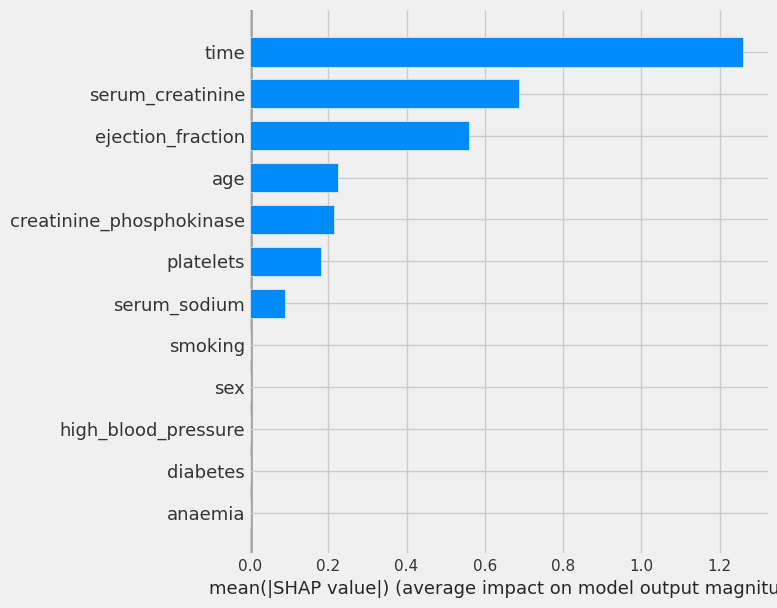

In [251]:
# Initialize JavaScript for SHAP visualizations
shap.initjs()

# Create a force plot for the negative instance
shap.force_plot(
    explainer.expected_value, # Base value
    shap_values[negative_instance_index], # SHAP values for the instance
    negative_instance,
    link="logit" # If your model is a binary classifier, you can use the 'logit' link
)
# Create a summary plot
shap.summary_plot(shap_values, X_test, plot_type="bar")


## Predict_probab for every grid search 

In [252]:
print (lr_grid_search.predict_proba(X.iloc[1].values.reshape(-1,12)))
print (lr_grid_search.predict_proba(X.iloc[14].values.reshape(-1,12)))

[[0.47853731 0.52146269]]
[[0.49164372 0.50835628]]


In [253]:
print (dt_grid_search.predict_proba(X.iloc[1].values.reshape(-1,12)))
print (dt_grid_search.predict_proba(X.iloc[14].values.reshape(-1,12)))

[[0.17105263 0.82894737]]
[[0.17105263 0.82894737]]


In [254]:
print (rf_grid_search.predict_proba(X.iloc[1].values.reshape(-1,12)))
print (rf_grid_search.predict_proba(X.iloc[14].values.reshape(-1,12)))

[[0.26532383 0.73467617]]
[[0.52702358 0.47297642]]


In [255]:
print (xgb_grid_search.predict_proba(X.iloc[1].values.reshape(-1,12)))
print (xgb_grid_search.predict_proba(X.iloc[14].values.reshape(-1,12)))

[[0.27566242 0.7243376 ]]
[[0.5335194 0.4664806]]
